In [1]:
!git clone https://github.com/sskyisthelimit/DS_Internship.git

Cloning into 'DS_Internship'...
remote: Enumerating objects: 535, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 535 (delta 0), reused 2 (delta 0), pack-reused 530 (from 2)
Receiving objects: 100% (535/535), 325.27 MiB | 40.86 MiB/s, done.
Resolving deltas: 100% (234/234), done.
Updating files: 100% (57/57), done.


In [2]:
cd DS_Internship/CV/

/kaggle/working/DS_Internship/CV


In [ ]:
!pip install -r requirements.txt

In [4]:
cd ../../

/kaggle/working


In [ ]:
!git clone --quiet https://github.com/cvg/LightGlue/
%cd LightGlue
!pip install --progress-bar off --quiet -e .

In [6]:
filepath1 = "/kaggle/input/satellite-test-set/S2A_MSIL2A_20191206T085341_N0213_R107_T36UXA_20191206T102420/T36UXA_20191206T085341_TCI_10m.jp2"
filepath2 = "/kaggle/input/satellite-test-set/S2B_MSIL2A_20200320T084639_N0214_R107_T36UXA_20200320T112112/T36UXA_20200320T084639_TCI_10m.jp2"

In [ ]:
from lightglue import LightGlue, SuperPoint
device = "cuda:0"

extractor_model = SuperPoint(max_num_keypoints=1500).eval().to(device)
matcher_model = LightGlue(features="superpoint").eval().to(device)

In [8]:
cd ../DS_Internship/CV/src

/kaggle/working/DS_Internship/CV/src


In [10]:
from inference_utils import (
    visualize_kpts, load_npy,
    lightglue_matcher, visualize_matches
)
matches_filenames = ["img1_matches.npy", "img2_matches.npy"]
kpts_filenames = ["img_1_kpts.npy", "img_2_kpts.npy"]

lightglue_matcher(
      path_img_1=filepath1,
      path_img_2=filepath2,
      matcher=matcher_model,
      extractor=extractor_model,
      w=10980,
      h=10980,
      n_pair=20,
      crp_w=1098,
      crp_h=1098,
      device=device,
      save_dir="/kaggle/working",
      limit_printing=None,
      matches_filenames=matches_filenames,
      kpts_filenames=kpts_filenames,
      padding=12)

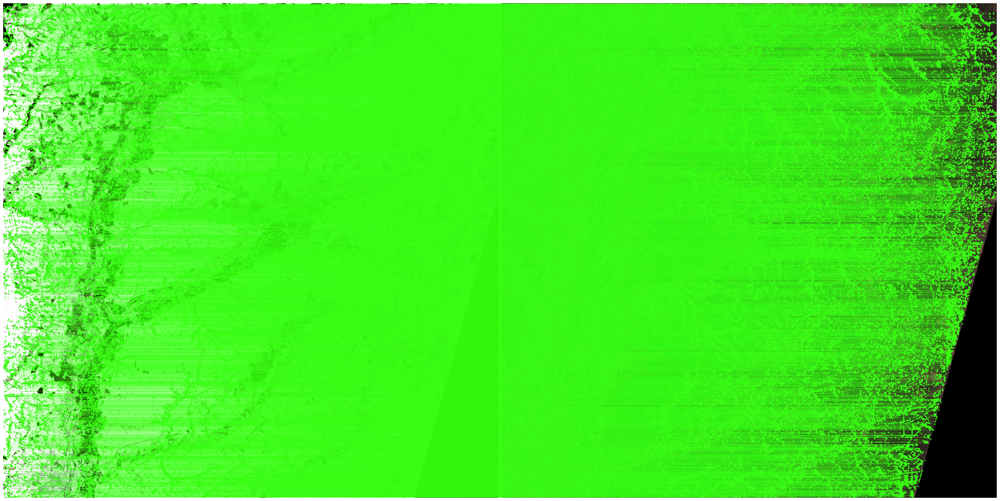

In [11]:
import cv2
plotting_size = 2000

img1 = cv2.cvtColor(cv2.imread(filepath1), cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread(filepath2), cv2.COLOR_BGR2RGB)

resized_img1 = cv2.resize(img1, (plotting_size, plotting_size), interpolation=cv2.INTER_AREA)
resized_img2 = cv2.resize(img2, (plotting_size, plotting_size), interpolation=cv2.INTER_AREA)

img_1_matches, img_2_matches = load_npy(
    filenames=matches_filenames,
    save_dir="/kaggle/working"
) 

img_1_matches *= [plotting_size / img1.shape[1], plotting_size / img1.shape[0]]
img_2_matches *= [plotting_size / img2.shape[1], plotting_size / img2.shape[0]]

visualize_matches(resized_img1, resized_img2, img_1_matches, img_2_matches)

i use padding parameter to add intersections beetween crops, because when padding is 0 we get 'white' (not lime color as if for this case) lines on image without matches, i think the problem is in - how matcher behaves on borders of image

In [12]:
print(img_1_matches.shape)
print(img_2_matches.shape)

(63433, 2)
(63433, 2)


/kaggle/working/DS_Internship/CV/src/inference_utils.py:362: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(kpts[:, 0], kpts[:, 1],


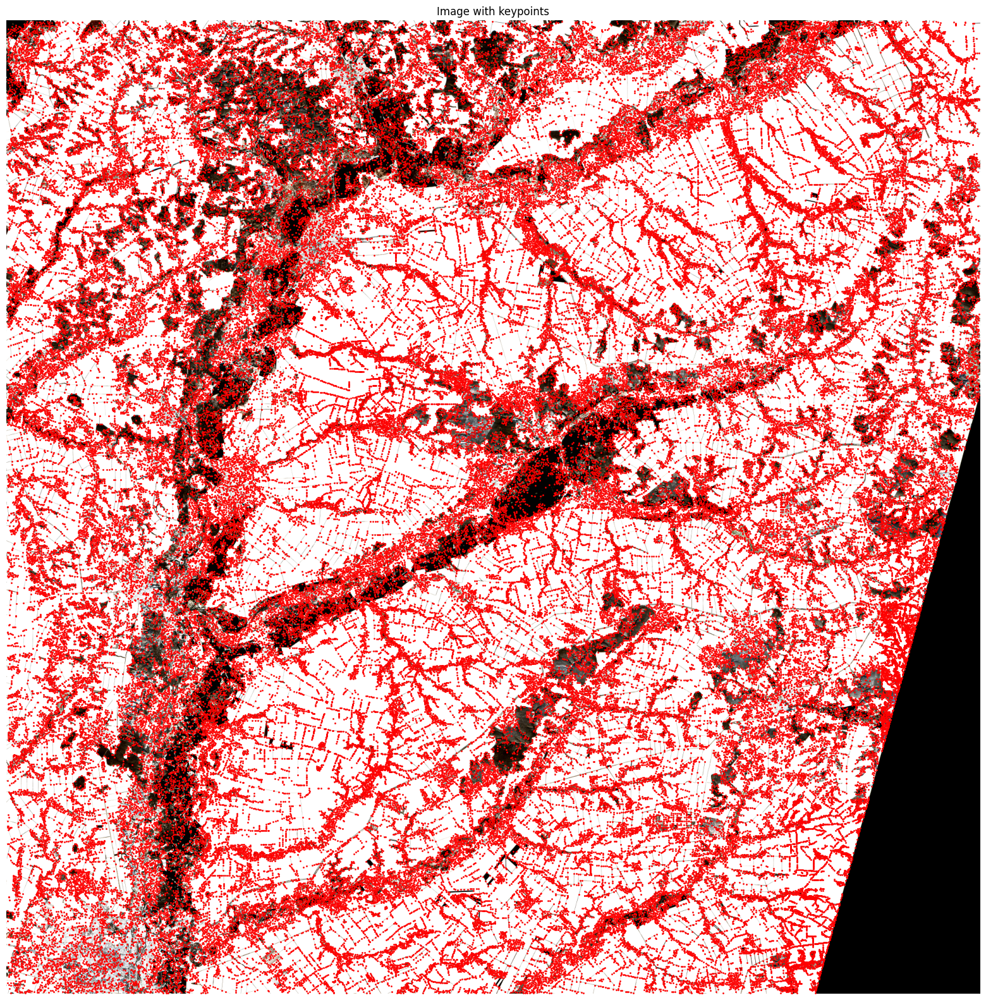

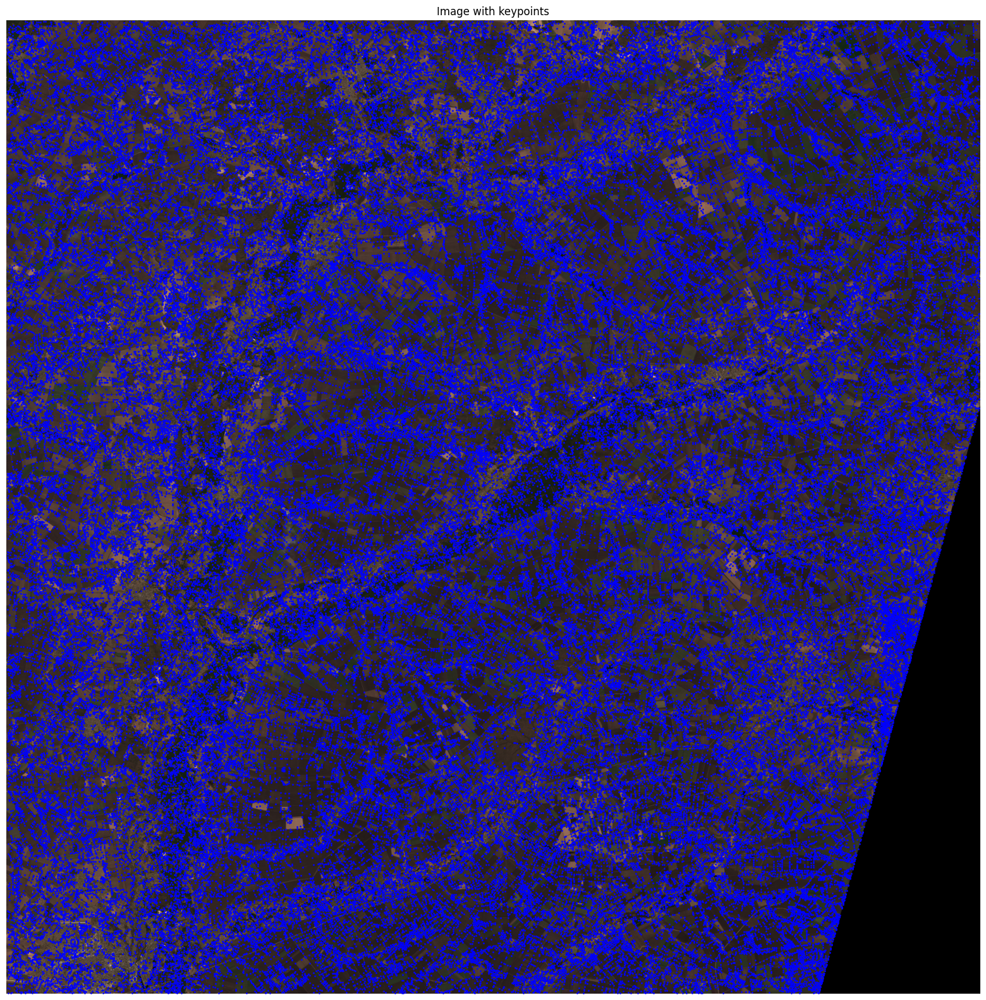

In [17]:
kpts1, kpts2 = load_npy(filenames=kpts_filenames,
                       save_dir="/kaggle/working/")

img1_kpts = cv2.cvtColor(cv2.imread(filepath1), cv2.COLOR_BGR2RGB)
img2_kpts = cv2.cvtColor(cv2.imread(filepath2), cv2.COLOR_BGR2RGB)

scale_x = plotting_size / img1_kpts.shape[1]
scale_y = plotting_size / img1_kpts.shape[0]

kpts1 = kpts1 * [scale_x, scale_y]
kpts2 = kpts2 * [scale_x, scale_y]

resized_kpts_img1 = cv2.resize(img1_kpts, (plotting_size, plotting_size), interpolation=cv2.INTER_AREA)
resized_kpts_img2 = cv2.resize(img2_kpts, (plotting_size, plotting_size), interpolation=cv2.INTER_AREA)

visualize_kpts(resized_kpts_img1,
              kpts1)

visualize_kpts(resized_kpts_img2,
              kpts2,
              color=(0, 0, 255))

In [18]:
print(kpts1.shape)
print(kpts2.shape)

(145621, 2)
(145815, 2)
